In [1]:
import glob
import ast
import time
import numpy as np
import pandas as pd
from tqdm import tqdm 
import cv2
import json
import collections
from PIL import Image
import re
import joblib
import matplotlib.pyplot as plt
import gc
import zipfile

from tqdm import tqdm
import shutil

np.random.seed(42)

In [2]:
import warnings
warnings.filterwarnings('ignore')

### Loading package

In [3]:
import sys
from pathlib import Path

here_path = Path().resolve()
repo_path = here_path.parents[1]
sys.path.append(str(repo_path))

In [4]:
from py.utils import verifyDir,verifyFile, verifyDataFrame

In [5]:
from py.config import Config

cfg = Config()

np.random.seed(cfg.RANDOM_STATE)
cfg.DATA_PATH, cfg.MODEL_PATH

('/media/felipe/DATA20/datasets/', '/media/felipe/DATA20/models/')

In [6]:
QSCORE_PATH=f"{cfg.DATA_PATH}pp2/Qscores/"
IMAGES_PATH = f"{cfg.DATA_PATH}pp2/images/"

SEG_DATASET_DIR = f"{cfg.DATA_PATH}{cfg.SEG_DATASET}/"
UPD4K_DIR = f"{cfg.DATA_PATH}/{cfg.UPD_DATASET}/"

In [7]:
MODEL_DIR = f"{cfg.MODEL_PATH}"
MODEL_DIR += f"{cfg.SEG_DATASET}_{cfg.UPD_DATASET}" if cfg.USE_UPD else f"{cfg.SEG_DATASET}"
MODEL_DIR += "_group/" if cfg.BY_GROUPS else "/"
MODEL_DIR += "" if cfg.USE_UPD else f"{cfg.SEG_MODEL_NAME}/"
MODEL_DIR += f"{cfg.ML_TASK}/"
MODEL_DIR

'/media/felipe/DATA20/models/ADE20k_UPD4k_group/classifications/'

In [8]:
verifyDir(MODEL_DIR)

In [9]:
SEGMENT_DIR = f"{cfg.DATA_PATH}"
SEGMENT_DIR += f"UrbanPhysicalDisorder/{cfg.UPD_DATASET}" if cfg.USE_UPD else f"pp2/segmentations/{cfg.SEG_DATASET}"
SEGMENT_DIR += "_group/" if cfg.BY_GROUPS else "/"
SEGMENT_DIR += "" if cfg.USE_UPD else f"{cfg.SEG_MODEL_NAME}/"
SEGMENT_DIR

'/media/felipe/DATA20/datasets/UrbanPhysicalDisorder/UPD4k_group/'

### Loading segmentations

In [10]:
from py.datasets.segmentation import UPD4KDataset

uss = UPD4KDataset(data_path=UPD4K_DIR)
uss.load(dataset=cfg.SEG_DATASET, data_path=SEG_DATASET_DIR)

In [11]:
seg_df = pd.read_csv(f"{SEGMENT_DIR}{cfg.CITY_STUDIED}/segmentations.csv", sep=";", low_memory=False)
seg_df["seg_image_path"] = f"{SEGMENT_DIR}" + seg_df["seg_image_path"]
seg_df["seg_overlay_image_path"] = f"{SEGMENT_DIR}" + seg_df["seg_overlay_image_path"]
seg_df["mask_path"] = f"{SEGMENT_DIR}" + seg_df["mask_path"]
seg_df["ratio_path"] = f"{SEGMENT_DIR}" + seg_df["ratio_path"]
seg_df

,image_id,seg_image_path,seg_overlay_image_path,mask_path,ratio_path,broken_damaged_bricks_wall,broken_damaged_pavement_road,car_taxi,city_elements,construction,floor,garbage_bag,graffiti,human,overhead_cable,sky,terrain_vehicle,trashcan,vegetation
0,50f5ea5bfdc9f065f0007ab0,/media/felipe/DATA20/datasets/UrbanPhysicalDis...,/media/felipe/DATA20/datasets/UrbanPhysicalDis...,/media/felipe/DATA20/datasets/UrbanPhysicalDis...,/media/felipe/DATA20/datasets/UrbanPhysicalDis...,0.0000,5.405000,0.0,0.241667,10.665833,32.825000,0.000000,0.000000,0.005833,5.370000,27.408333,1.295000,0.000000,16.777500
1,50f5ea5bfdc9f065f0007ab1,/media/felipe/DATA20/datasets/UrbanPhysicalDis...,/media/felipe/DATA20/datasets/UrbanPhysicalDis...,/media/felipe/DATA20/datasets/UrbanPhysicalDis...,/media/felipe/DATA20/datasets/UrbanPhysicalDis...,0.0000,0.000000,0.0,0.000000,7.706667,11.911667,0.316667,0.000000,0.700833,0.000000,7.156667,7.540000,0.000000,62.349167
2,50f5ea5bfdc9f065f0007ab2,/media/felipe/DATA20/datasets/UrbanPhysicalDis...,/media/felipe/DATA20/datasets/UrbanPhysicalDis...,/media/felipe/DATA20/datasets/UrbanPhysicalDis...,/media/felipe/DATA20/datasets/UrbanPhysicalDis...,0.0000,0.000000,0.0,1.187500,26.355000,26.700833,0.000000,1.174167,0.000000,4.291667,33.570000,0.271667,1.579167,4.863333
3,50f5ea5bfdc9f065f0007ab3,/media/felipe/DATA20/datasets/UrbanPhysicalDis...,/media/felipe/DATA20/datasets/UrbanPhysicalDis...,/media/felipe/DATA20/datasets/UrbanPhysicalDis...,/media/felipe/DATA20/datasets/UrbanPhysicalDis...,0.0000,0.000000,0.0,0.000000,1.163333,0.421667,0.000000,0.000000,0.000000,0.000000,10.571667,87.843333,0.000000,0.000000
4,50f5ea5bfdc9f065f0007ab4,/media/felipe/DATA20/datasets/UrbanPhysicalDis...,/media/felipe/DATA20/datasets/UrbanPhysicalDis...,/media/felipe/DATA20/datasets/UrbanPhysicalDis...,/media/felipe/DATA20/datasets/UrbanPhysicalDis...,0.0000,0.000000,0.0,0.000000,45.927500,1.735000,0.000000,0.000000,0.000000,0.000000,36.885000,0.000000,0.000000,15.452500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3639,50f5ec44fdc9f065f000890f,/media/felipe/DATA20/datasets/UrbanPhysicalDis...,/media/felipe/DATA20/datasets/UrbanPhysicalDis...,/media/felipe/DATA20/datasets/UrbanPhysicalDis...,/media/felipe/DATA20/datasets/UrbanPhysicalDis...,11.6050,5.516667,0.0,1.496667,26.320000,23.499167,0.000000,0.000000,0.000000,4.249167,20.913333,0.000000,0.000000,6.400000
3640,50f5ec44fdc9f065f0008910,/media/felipe/DATA20/datasets/UrbanPhysicalDis...,/media/felipe/DATA20/datasets/UrbanPhysicalDis...,/media/felipe/DATA20/datasets/UrbanPhysicalDis...,/media/felipe/DATA20/datasets/UrbanPhysicalDis...,3.3400,3.986667,0.0,1.461667,36.265000,11.671667,0.077500,0.000000,0.000000,6.012500,15.058333,8.090000,0.000000,13.621667
3641,50f5ec44fdc9f065f0008911,/media/felipe/DATA20/datasets/UrbanPhysicalDis...,/media/felipe/DATA20/datasets/UrbanPhysicalDis...,/media/felipe/DATA20/datasets/UrbanPhysicalDis...,/media/felipe/DATA20/datasets/UrbanPhysicalDis...,6.7425,9.031667,0.0,2.005833,36.983333,16.257500,0.000000,0.000000,0.000000,11.570833,15.582500,0.038333,0.000000,0.750000
3642,50f5ec44fdc9f065f0008912,/media/felipe/DATA20/datasets/UrbanPhysicalDis...,/media/felipe/DATA20/datasets/UrbanPhysicalDis...,/media/felipe/DATA20/datasets/UrbanPhysicalDis...,/media/felipe/DATA20/datasets/UrbanPhysicalDis...,2.9825,7.010833,0.0,0.380000,13.450833,25.781667,0.000000,0.000000,0.130000,8.115833,9.644167,0.670833,0.204167,31.629167


In [12]:
from py.datasets.segmentation import FeatureProcessor

feature_processor = FeatureProcessor()

In [13]:
segmentations_df = feature_processor.process(seg_df, 
                                             class_to_group=uss.get_class_groups(), 
                                             filter_features=cfg.FILTER_FEATURES, 
                                             aggregate_classes=cfg.BY_GROUPS, 
                                             binarize_values=cfg.BINARIZE_FEATURES,
                                           )
segmentations_df.info()

<class 'pandas.DataFrame'>
RangeIndex: 3644 entries, 0 to 3643
Data columns (total 19 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   image_id                      3644 non-null   str    
 1   seg_image_path                3644 non-null   str    
 2   seg_overlay_image_path        3644 non-null   str    
 3   mask_path                     3644 non-null   str    
 4   ratio_path                    3644 non-null   str    
 5   broken_damaged_bricks_wall    3644 non-null   float64
 6   broken_damaged_pavement_road  3644 non-null   float64
 7   car_taxi                      3644 non-null   float64
 8   city_elements                 3644 non-null   float64
 9   construction                  3644 non-null   float64
 10  floor                         3644 non-null   float64
 11  garbage_bag                   3644 non-null   float64
 12  graffiti                      3644 non-null   float64
 13  human         

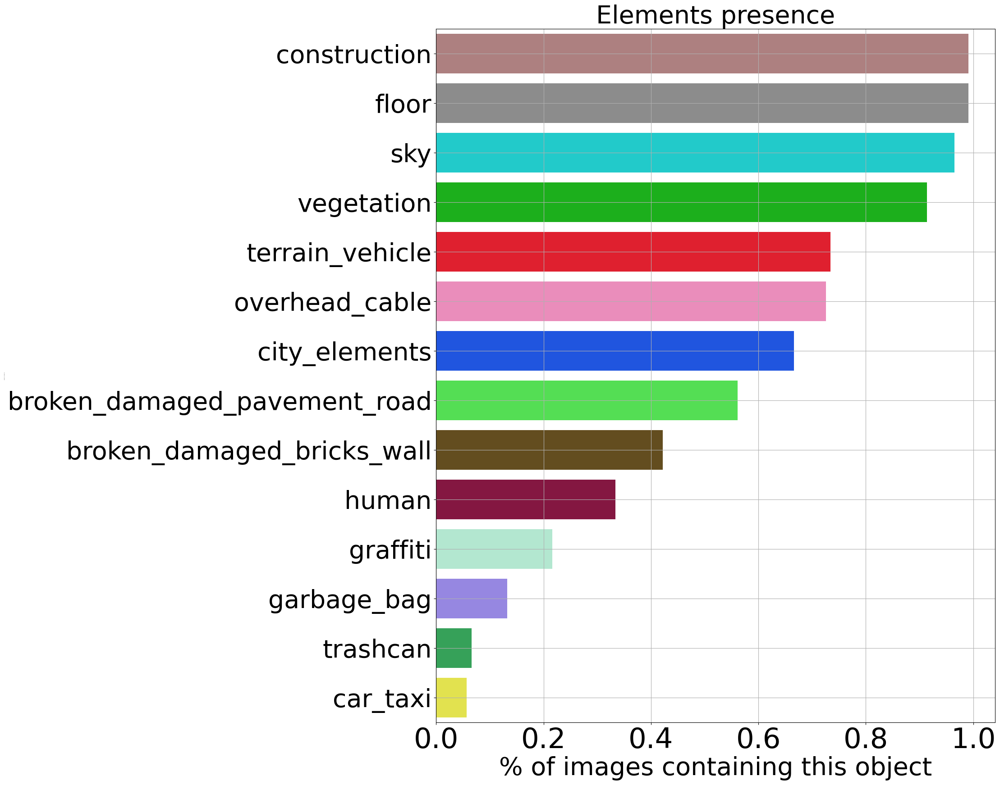

In [14]:
feature_presence = feature_processor.calculate_features_presence(segmentations_df.iloc[:, 5:])
feature_processor.plot_presences(feature_presence, palette=uss.get_color_dict(by_name=True, by_group=cfg.BY_GROUPS), fig_size=(16,20), top_k=15)

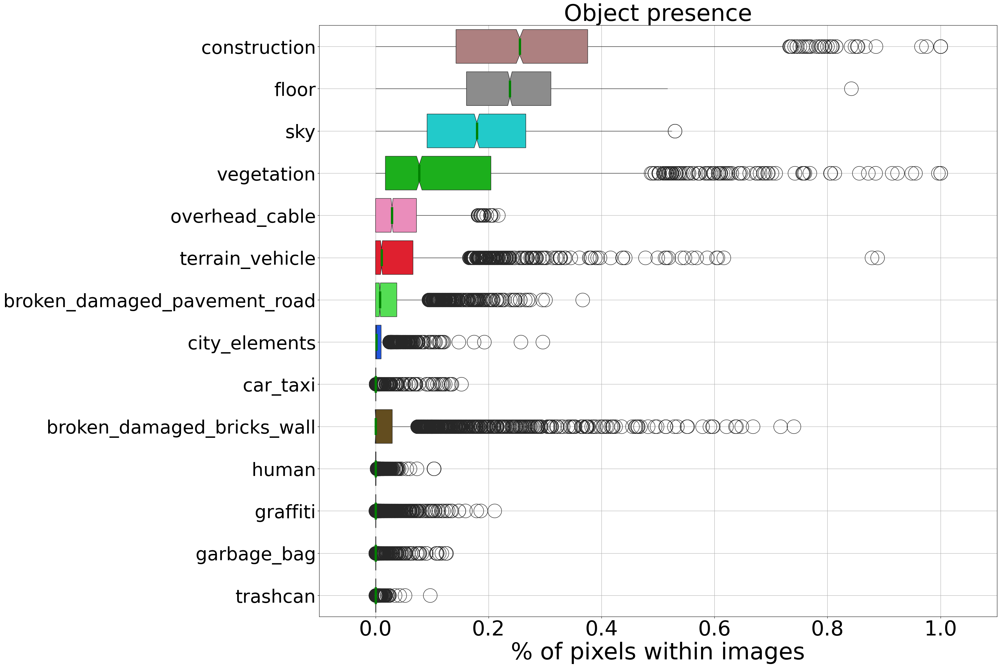

In [15]:
feature_processor.plot_boxplots(segmentations_df.iloc[:, 5:], palette=uss.get_color_dict(by_name=True, by_group=cfg.BY_GROUPS), fig_size=(30,20), top_k=15)

In [16]:
verifyDataFrame(segmentations_df)

Rows with all zeros: [], size: 0
Columns with all zeros: [], size: 0


### Loading data

In [17]:
%%time
scores_df = pd.read_csv(f"{QSCORE_PATH}scores.csv", sep=";", low_memory=False)
scores_df = scores_df[scores_df[cfg.PERCEPTION_METRIC]!=0.0].copy()
if cfg.CITY_STUDIED.lower() != "all":
    scores_df = scores_df[scores_df["city"]==cfg.CITY_STUDIED].copy()
scores_df["image_path"] = f"{IMAGES_PATH}" + scores_df["image_path"]
scores_df.sort_values(by=["safety"], ascending=False, inplace=True)
scores_df

CPU times: user 164 ms, sys: 38 ms, total: 202 ms
Wall time: 201 ms


,image_id,lat,long,city,country,continent,safety,beautiful,wealthy,lively,boring,depressing,image_path
21939,50f5ead0fdc9f065f0007d6f,-22.794015,-43.304596,Rio De Janeiro,Brasil,South America,8.260870,1.805556,2.388889,6.656085,5.619048,5.505051,/media/felipe/DATA20/datasets/pp2/images/Rio D...
22133,50f5eaecfdc9f065f0007e32,-22.901318,-43.178843,Rio De Janeiro,Brasil,South America,8.074111,7.222222,6.521164,5.259259,2.444444,5.000000,/media/felipe/DATA20/datasets/pp2/images/Rio D...
23068,50f5eb4bfdc9f065f00081e0,-22.924839,-43.387912,Rio De Janeiro,Brasil,South America,7.990805,3.015873,3.333333,3.767806,2.500000,2.261905,/media/felipe/DATA20/datasets/pp2/images/Rio D...
23210,50f5eb65fdc9f065f000826f,-22.829954,-43.374070,Rio De Janeiro,Brasil,South America,7.920455,3.740079,3.117284,3.333333,2.222222,5.000000,/media/felipe/DATA20/datasets/pp2/images/Rio D...
23295,50f5eb69fdc9f065f00082c6,-22.865179,-43.426716,Rio De Janeiro,Brasil,South America,7.916667,4.444444,2.314815,4.330527,6.805556,1.333333,/media/felipe/DATA20/datasets/pp2/images/Rio D...
...,...,...,...,...,...,...,...,...,...,...,...,...,...
22692,50f5eb26fdc9f065f0008065,-22.912840,-43.252074,Rio De Janeiro,Brasil,South America,0.833333,3.574074,2.666667,2.940985,5.000000,7.296296,/media/felipe/DATA20/datasets/pp2/images/Rio D...
21777,50f5eac8fdc9f065f0007ccc,-22.775293,-43.391274,Rio De Janeiro,Brasil,South America,0.833333,2.500000,1.666667,5.274365,2.055556,7.619048,/media/felipe/DATA20/datasets/pp2/images/Rio D...
21502,50f5eaa8fdc9f065f0007bb4,-22.849767,-43.324763,Rio De Janeiro,Brasil,South America,0.769231,4.898148,3.111111,5.380952,7.638889,3.777778,/media/felipe/DATA20/datasets/pp2/images/Rio D...
22717,50f5eb27fdc9f065f000807f,-22.853284,-43.319558,Rio De Janeiro,Brasil,South America,0.512821,3.333333,2.222222,4.174539,5.592593,6.333333,/media/felipe/DATA20/datasets/pp2/images/Rio D...


In [18]:
scores_df = pd.read_csv(f"{QSCORE_PATH}scores.csv", sep=";", low_memory=False)
dataset_df = pd.merge(scores_df, segmentations_df, on="image_id", how="inner")
dataset_df.info()

<class 'pandas.DataFrame'>
RangeIndex: 3644 entries, 0 to 3643
Data columns (total 31 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   image_id                      3644 non-null   str    
 1   lat                           3644 non-null   float64
 2   long                          3644 non-null   float64
 3   city                          3644 non-null   str    
 4   country                       3644 non-null   str    
 5   continent                     3644 non-null   str    
 6   safety                        3644 non-null   float64
 7   beautiful                     3644 non-null   float64
 8   wealthy                       3644 non-null   float64
 9   lively                        3644 non-null   float64
 10  boring                        3644 non-null   float64
 11  depressing                    3644 non-null   float64
 12  image_path                    3644 non-null   str    
 13  seg_image_path

Applying u and delta*std
u: 3.9866248127979276 std: 1.1985878344476641
superior: 4.945495080356059 inferior: 3.0277545452397963
Top max: 8.26086956521739, min:4.945778139497733, size: 708
Bot max: 3.023971679842125, min:0.4761904761904764, size: 717


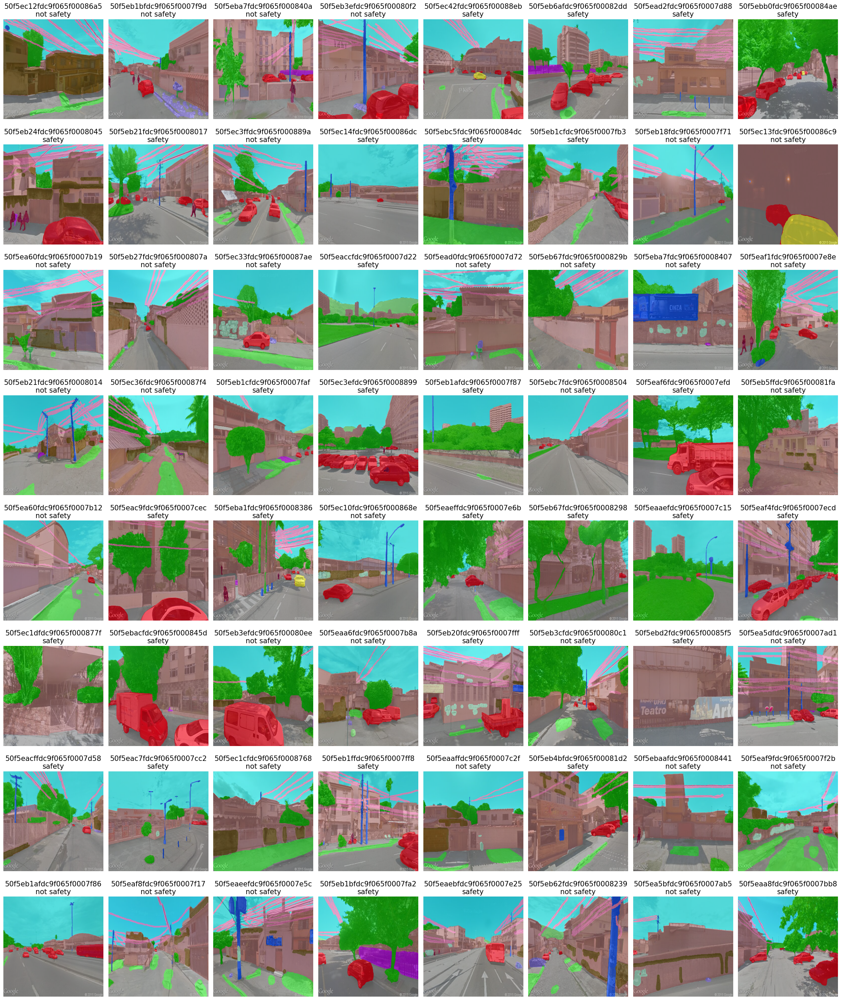

In [19]:
# Prepare data splits
from py.models.datasets import PlacePulse

pp = PlacePulse(dataset_df)
pp.DataPreparation(delta=0.8, emotion=cfg.PERCEPTION_METRIC, divide_by="std")
pp.TaskPreparation(task_type=cfg.ML_TASK)
pp.DataSplit()
pp.plot(img_to_show="seg_overlay_image_path")

### Loading model

In [20]:
from py.models.classification.ensemble import EnsembleClassifier

tm = EnsembleClassifier(model_name=cfg.MODEL_TASK_NAME, scaler_name="standard")
tm.model_zoo()
tm.initialize_grid()
tm.get_model()

Model zoo: ['DecisionTree', 'RandomForest', 'GradientBoosting', 'AdaBoost'] 



,"estimator estimator: estimator objectThis is assumed to implement the scikit-learn estimator interface.Either estimator needs to provide a ``score`` function,or ``scoring`` must be passed.",Pipeline(step...m_state=42))])
,"param_grid param_grid: dict or list of dictionariesDictionary with parameters names (`str`) as keys and lists ofparameter settings to try as values, or a list of suchdictionaries, in which case the grids spanned by each dictionaryin the list are explored. This enables searching over any sequenceof parameter settings.","{'classifier__bootstrap': [True], 'classifier__max_depth': [20], 'classifier__max_features': [None], 'classifier__min_samples_leaf': [3], ...}"
,"scoring scoring: str, callable, list, tuple or dict, default=NoneStrategy to evaluate the performance of the cross-validated model onthe test set.If `scoring` represents a single score, one can use:- a single string (see :ref:`scoring_string_names`);- a callable (see :ref:`scoring_callable`) that returns a single value;- `None`, the `estimator`'s :ref:`default evaluation criterion ` is used.If `scoring` represents multiple scores, one can use:- a list or tuple of unique strings;- a callable returning a dictionary where the keys are the metric names and the values are the metric scores;- a dictionary with metric names as keys and callables as values.See :ref:`multimetric_grid_search` for an example.",'balanced_accuracy'
,"n_jobs n_jobs: int, default=NoneNumber of jobs to run in parallel.``None`` means 1 unless in a :obj:`joblib.parallel_backend` context.``-1`` means using all processors. See :term:`Glossary `for more details... versionchanged:: v0.20 `n_jobs` default changed from 1 to None",5
,"refit refit: bool, str, or callable, default=TrueRefit an estimator using the best found parameters on the wholedataset.For multiple metric evaluation, this needs to be a `str` denoting thescorer that would be used to find the best parameters for refittingthe estimator at the end.Where there are considerations other than maximum score inchoosing a best estimator, ``refit`` can be set to a function whichreturns the selected ``best_index_`` given ``cv_results_``. In thatcase, the ``best_estimator_`` and ``best_params_`` will be setaccording to the returned ``best_index_`` while the ``best_score_``attribute will not be available.The refitted estimator is made available at the ``best_estimator_``attribute and permits using ``predict`` directly on this``GridSearchCV`` instance.Also for multiple metric evaluation, the attributes ``best_index_``,``best_score_`` and ``best_params_`` will only be available if``refit`` is set and all of them will be determined w.r.t this specificscorer.See ``scoring`` parameter to know more about multiple metricevaluation.See :ref:`sphx_glr_auto_examples_model_selection_plot_grid_search_digits.py`to see how to design a custom selection strategy using a callablevia `refit`.See :ref:`this example`for an example of how to use ``refit=callable`` to balance modelcomplexity and cross-validated score... versionchanged:: 0.20 Support for callable added.",True
,"cv cv: int, cross-validation generator or an iterable, default=NoneDetermines the cross-validation splitting strategy.Possible inputs for cv are:- None, to use the default 5-fold cross validation,- integer, to specify the number of folds in a `(Stratified)KFold`,- :term:`CV splitter`,- An iterable yielding (train, test) splits as arrays of indices.For integer/None inputs, if the estimator is a classifier and ``y`` iseither binary or multiclass, :class:`StratifiedKFold` is used. In allother cases, :class:`KFold` is used. These splitters are instantiatedwith `shuffle=False` so the splits will be the same across calls.Refer :ref:`User Guide ` for the variouscross-validation strategies that can be used here... versionchanged:: 0.22 ``cv`` default value if None changed from 3-fold to 5-fold.",StratifiedKFo...shuffle=False)
,"verbose verbose: intControls the verbosity: the higher, the more me

### Training

In [21]:
feature_names = pp.train_df.iloc[:, 17:-2].columns.tolist()
X_train = pp.train_df.iloc[:, 17:-2].values
y_train = pp.train_df["target"].tolist()

X_test = pp.test_df.iloc[:, 17:-2].values
y_test = pp.test_df["target"].tolist()

In [22]:
len(feature_names), X_train.shape, X_test.shape

(14, (1068, 14), (357, 14))

In [23]:
collections.Counter(y_train), collections.Counter(y_test)

(Counter({0: 537, 1: 531}), Counter({0: 180, 1: 177}))

In [24]:
tm.model_grid.fit(X_train, y_train)

,"estimator estimator: estimator objectThis is assumed to implement the scikit-learn estimator interface.Either estimator needs to provide a ``score`` function,or ``scoring`` must be passed.",Pipeline(step...m_state=42))])
,"param_grid param_grid: dict or list of dictionariesDictionary with parameters names (`str`) as keys and lists ofparameter settings to try as values, or a list of suchdictionaries, in which case the grids spanned by each dictionaryin the list are explored. This enables searching over any sequenceof parameter settings.","{'classifier__bootstrap': [True], 'classifier__max_depth': [20], 'classifier__max_features': [None], 'classifier__min_samples_leaf': [3], ...}"
,"scoring scoring: str, callable, list, tuple or dict, default=NoneStrategy to evaluate the performance of the cross-validated model onthe test set.If `scoring` represents a single score, one can use:- a single string (see :ref:`scoring_string_names`);- a callable (see :ref:`scoring_callable`) that returns a single value;- `None`, the `estimator`'s :ref:`default evaluation criterion ` is used.If `scoring` represents multiple scores, one can use:- a list or tuple of unique strings;- a callable returning a dictionary where the keys are the metric names and the values are the metric scores;- a dictionary with metric names as keys and callables as values.See :ref:`multimetric_grid_search` for an example.",'balanced_accuracy'
,"n_jobs n_jobs: int, default=NoneNumber of jobs to run in parallel.``None`` means 1 unless in a :obj:`joblib.parallel_backend` context.``-1`` means using all processors. See :term:`Glossary `for more details... versionchanged:: v0.20 `n_jobs` default changed from 1 to None",5
,"refit refit: bool, str, or callable, default=TrueRefit an estimator using the best found parameters on the wholedataset.For multiple metric evaluation, this needs to be a `str` denoting thescorer that would be used to find the best parameters for refittingthe estimator at the end.Where there are considerations other than maximum score inchoosing a best estimator, ``refit`` can be set to a function whichreturns the selected ``best_index_`` given ``cv_results_``. In thatcase, the ``best_estimator_`` and ``best_params_`` will be setaccording to the returned ``best_index_`` while the ``best_score_``attribute will not be available.The refitted estimator is made available at the ``best_estimator_``attribute and permits using ``predict`` directly on this``GridSearchCV`` instance.Also for multiple metric evaluation, the attributes ``best_index_``,``best_score_`` and ``best_params_`` will only be available if``refit`` is set and all of them will be determined w.r.t this specificscorer.See ``scoring`` parameter to know more about multiple metricevaluation.See :ref:`sphx_glr_auto_examples_model_selection_plot_grid_search_digits.py`to see how to design a custom selection strategy using a callablevia `refit`.See :ref:`this example`for an example of how to use ``refit=callable`` to balance modelcomplexity and cross-validated score... versionchanged:: 0.20 Support for callable added.",True
,"cv cv: int, cross-validation generator or an iterable, default=NoneDetermines the cross-validation splitting strategy.Possible inputs for cv are:- None, to use the default 5-fold cross validation,- integer, to specify the number of folds in a `(Stratified)KFold`,- :term:`CV splitter`,- An iterable yielding (train, test) splits as arrays of indices.For integer/None inputs, if the estimator is a classifier and ``y`` iseither binary or multiclass, :class:`StratifiedKFold` is used. In allother cases, :class:`KFold` is used. These splitters are instantiatedwith `shuffle=False` so the splits will be the same across calls.Refer :ref:`User Guide ` for the variouscross-validation strategies that can be used here... versionchanged:: 0.22 ``cv`` default value if None changed from 3-fold to 5-fold.",StratifiedKFo...shuffle=False)
,"verbose verbose: intControls the verbosity: the higher, the more me

In [25]:
tm.model_grid.best_score_, tm.model_grid.best_params_

(np.float64(0.6869433178549735),
 {'classifier__bootstrap': True,
  'classifier__max_depth': 20,
  'classifier__max_features': None,
  'classifier__min_samples_leaf': 3,
  'classifier__min_samples_split': 6,
  'classifier__n_estimators': 200})

In [26]:
from sklearn.metrics import classification_report

In [27]:
pp.label_map

{0: 'not safety', 1: 'safety'}

In [28]:
y_pred = tm.model_grid.predict(X_test)
test_report = classification_report(y_test, y_pred, output_dict=True)

print(classification_report(y_test, y_pred, target_names=list(pp.label_map.values())))

              precision    recall  f1-score   support

  not safety       0.68      0.72      0.70       180
      safety       0.69      0.66      0.67       177

    accuracy                           0.69       357
   macro avg       0.69      0.69      0.69       357
weighted avg       0.69      0.69      0.69       357



In [29]:
confusion_matrix = pd.crosstab(
    pd.Series([pp.label_map[k] for k in y_test], name="Real"),
    pd.Series([pp.label_map[k] for k in y_pred], name="Prediction")
)
confusion_matrix

Prediction,not safety,safety
Real,,
not safety,129,51
safety,61,116


### Feature Importance

In [30]:
import seaborn as sns

In [31]:
importances = tm.model_grid.best_estimator_[1].feature_importances_
# std = np.std([tree.feature_importances_ for tree in tm.model_grid.best_estimator_[1].estimators_], axis=0)

In [32]:
forest_importances = pd.Series(importances, index=feature_names)
forest_importances.sort_values(ascending=False, inplace=True)
forest_importances_df = forest_importances.to_frame()
forest_importances_df.reset_index(inplace=True)
forest_importances

vegetation                      0.182366
broken_damaged_bricks_wall      0.134954
floor                           0.109291
sky                             0.101986
construction                    0.085578
terrain_vehicle                 0.084297
overhead_cable                  0.077241
city_elements                   0.066622
broken_damaged_pavement_road    0.063097
human                           0.038819
graffiti                        0.025222
garbage_bag                     0.021750
car_taxi                        0.004729
trashcan                        0.004048
dtype: float64

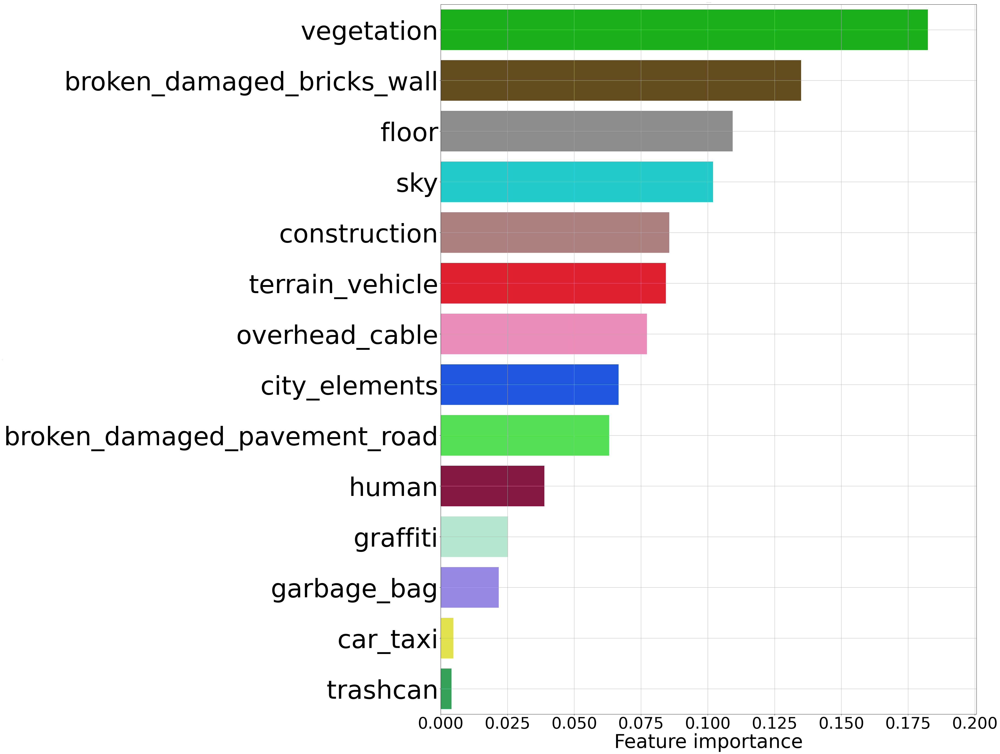

In [33]:
_, ax = plt.subplots(figsize=(30,40), nrows=1, ncols=1, sharex=False, sharey=False)

Top_k_features=15

palette = {
            k: tuple(v / 255 for v in rgb) if max(rgb) > 1 else rgb
            for k, rgb in uss.get_color_dict(by_name=True, by_group=cfg.BY_GROUPS).items()
        }

sns_fig = sns.barplot(
            data=forest_importances_df.iloc[:Top_k_features],
            x=forest_importances_df.iloc[:Top_k_features].columns[1],
            y=forest_importances_df.iloc[:Top_k_features].columns[0],
            orient="h",
            ax=ax,
            palette=palette,
            #order=estado_df.sort_values(estado_df.columns[1], ascending=False)[estado_df.columns[0]]
           )

sns_fig.set_title(f"Top {Top_k_features} feature importances", fontsize=0)
sns_fig.set_ylabel(f"Label", fontsize=0)
sns_fig.set_xlabel('Feature importance', fontsize=60)

# rotate the axis ticklabels
_ = sns_fig.tick_params(axis='x', rotation=0, labelsize=50)

# rotate the axis ticklabels
_ = sns_fig.tick_params(axis='y', labelsize=80)

# add annotation
# _ = sns_fig.bar_label(sns_fig.containers[0], fmt='%.4f', fontsize=15,rotation=0)
ax.grid(True)
# add a space on y for the annotations
sns_fig.margins(x=0.1)
plt.show()

### Saving data and model

In [34]:
OUT_NAME = f"{cfg.PERCEPTION_METRIC}"
OUT_NAME += "_filter" if cfg.FILTER_FEATURES else ""
OUT_NAME += "_bin" if cfg.BINARIZE_FEATURES else ""
OUT_NAME

'safety'

In [35]:
pp.data_df.to_csv(f"{MODEL_DIR}{OUT_NAME}_data.csv", sep=";", index=False)

In [36]:
pp.train_df.to_csv(f"{MODEL_DIR}{OUT_NAME}_data_train.csv", sep=";", index=False)

In [37]:
pp.test_df.to_csv(f"{MODEL_DIR}{OUT_NAME}_data_test.csv", sep=";", index=False)

In [38]:
joblib.dump(tm.model_grid, f'{MODEL_DIR}{OUT_NAME}_best.pkl')

['/media/felipe/DATA20/models/ADE20k_UPD4k_group/classifications/safety_best.pkl']

In [39]:
# with open(f'{MODEL_DIR}{OUT_NAME}_test_report.json', "w") as fp:
#     json.dump(test_report, fp)